# Duplicate detection - step 2: review and decide on candidate pairs

This notebook runs the second part of the duplicate detection algorithm on a dataframe with the following columns:

- `archiveType`       (used for duplicate detection algorithm)
- `dataSetName`
- `datasetId`
- `geo_meanElev`      (used for duplicate detection algorithm)
- `geo_meanLat`       (used for duplicate detection algorithm)
- `geo_meanLon`       (used for duplicate detection algorithm)
- `geo_siteName`      (used for duplicate detection algorithm)
- `interpretation_direction`
- `interpretation_seasonality`
- `interpretation_variable`
- `interpretation_variableDetails`
- `originalDataURL`
- `originalDatabase`
- `paleoData_notes`
- `paleoData_proxy`   (used for duplicate detection algorithm)
- `paleoData_units`
- `paleoData_values`  (used for duplicate detection algorithm, test for correlation, RMSE, correlation of 1st difference, RMSE of 1st difference)
- `paleoData_variableName`
- `year`              (used for duplicate detection algorithm)
- `yearUnits`

This interactive notebook runs a duplicate decision algorithm for a specific database, following the identification of the potential duplicate candidate pairs. The algorithm walks the operator through each of the detected duplicate candidate pairs from `dup_detection.ipynb` and runs a decision process to decide whether to keep or reject the identified records. 

The confirmed 'true' duplicates are saved in

`data/DATABASENAME/duplicate_detection/duplicate_decisions_DATABASENAME_AUTHORINITIALS_YY-MM-DD.csv`

10/11/2025 LL: tidied up with revised data organisation and prepared for documentation
27/11/2024 LL: Changed hierarchy FE23>PAGES 2k
22/10/2024 v1: Updated the decision process:
    - created backup decision file which is intermediately saved
    - outputs URL which can be copied and pasted into browser
    - implemented a composite option in the decision process, to create a composite of two records

Author: Lucie Luecke, created 27/9/2024



**Note**: The algorithm can be either started from scratch or from a backup file:


## Intialisation

### Set up working environment

Make sure the repo_root is added correctly, it should be: your_root_dir/dod2k
This should be the working directory throughout this notebook (and all other notebooks).

In [10]:
%load_ext autoreload
%autoreload 2

import sys
import os
from pathlib import Path

# Add parent directory to path (works from any notebook in notebooks/)
# the repo_root should be the parent directory of the notebooks folder
current_dir = Path().resolve()
# Determine repo root
if current_dir.name == 'dod2k': repo_root = current_dir
elif current_dir.parent.name == 'dod2k': repo_root = current_dir.parent
else: raise Exception('Please review the repo root structure (see first cell).')

# Update cwd and path only if needed
if os.getcwd() != str(repo_root):
    os.chdir(repo_root)
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

print(f"Repo root: {repo_root}")
if str(os.getcwd())==str(repo_root):
    print(f"Working directory matches repo root. ")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Repo root: /home/jupyter-lluecke/dod2k
Working directory matches repo root. 


In [11]:
import pandas as pd
import numpy as np
import datetime

from dod2k_utilities import ut_functions as utf # contains utility functions
from dod2k_utilities import ut_duplicate_search as dup # contains utility functions

### Load dataset

Define the dataset which needs to be screened for duplicates. Input files for the duplicate detection mechanism need to be compact dataframes (`pandas` dataframes with standardised columns and entry formatting). 

The function `load_compact_dataframe_from_csv` loads the dataframe from a `csv` file from `data\DB\`, with `DB` the name of the database. The database name (`db_name`) can be 
- `pages2k`
- `ch2k`
- `iso2k`
- `sisal`
- `fe23`

for the individual databases, 

or use 

- `all_merged`

to load the merged database of all individual databases, or can be any user defined compact dataframe.

In [12]:
# load dataframe
db_name='all_merged' 
# db_name='dup_test' 
df = utf.load_compact_dataframe_from_csv(db_name)

print(df.info())
df.name = db_name


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5147 entries, 0 to 5146
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   archiveType                    5147 non-null   object 
 1   dataSetName                    5147 non-null   object 
 2   datasetId                      5147 non-null   object 
 3   geo_meanElev                   5048 non-null   float32
 4   geo_meanLat                    5147 non-null   float32
 5   geo_meanLon                    5147 non-null   float32
 6   geo_siteName                   5147 non-null   object 
 7   interpretation_direction       5147 non-null   object 
 8   interpretation_seasonality     5147 non-null   object 
 9   interpretation_variable        5147 non-null   object 
 10  interpretation_variableDetail  5147 non-null   object 
 11  originalDataURL                5147 non-null   object 
 12  originalDatabase               5147 non-null   o

### Input operator's credentials

In order to keep maximum transparency and reproduceability, put in the operator's credentials here.

These details are used to flag the intermediate output files and provided along with the final duplicate free dataset.


In [13]:
initials = 'LL'
fullname = 'Lucie Luecke'
email    = 'ljluec1@st-andrews.ac.uk'

# initials = 'MNE'
# fullname = 'Michael Evans'
# email    = 'mnevans@umd.edu'

operator_details = [initials, fullname, email]

## Duplicate decision process

We now start the duplicate decision process.

### Hierarchy for duplicate removal for identical duplicates

For automated decisions, which apply to *identical* duplicates, we now define a hierarchy of databases, which decides which record should be kept.

First, list all the original databases:

In [14]:
for db in df.originalDatabase.unique():
    print(db)

PAGES 2k v2.2.0
FE23 (Breitenmoser et al. (2014))
CoralHydro2k v1.0.1
Iso2k v1.1.2
SISAL v3


Now assign a hierarchy (importance level) to the original databases. For $n$ original databases the hierarchy ranges from 1, the highest hierarchical value (most important, should always be kept), to the lowest value $n$ (least important, the lowest in the hierarchy).

The operator can choose its own hierarchy by passing a dictionary as a kwarg to the function `dup.define_hierarchy`, where each database is assigned an interger number according to its importance (0 the most important). 

By default the hierarchy uses the novelty of the databases for determining the importance level: 

`PAGES 2k v2.2.0` > `SISAL v3` > `CoralHydro2k v1.0.1` > `Iso2k v1.1.2` > `FE23 (Breitenmoser et al. (2014))`

In [26]:
# implement hierarchy for automated decisions for identical records

df = dup.define_hierarchy(df, hierarchy='default')

Chosen hierarchy:
1. PAGES 2k v2.2.0 (highest)
2. SISAL v3
3. CoralHydro2k v1.0.1
4. Iso2k v1.1.2
5. FE23 (Breitenmoser et al. (2014)) (lowest)


In [23]:
# make sure all datasetIds are unique.
assert len(set(df.datasetId))==len(df.datasetId)
assert (df.index==range(0, len(df), 1)).all()

### Duplicate decision process

The following cell takes you through the potential duplicate candidate pairs and lets you decide whether to 
- keep both records
- keep just one record
- delete both records
- create composite of both records.

Recollections and updates of duplicates are automatically selected, as well as identical duplicates following the hierarchy defined above. 

The output is saved in `data/DATABASENAME/dup_detection/dup_decisions_DATABASENAME_INITIALS_DATE.csv`

Summary figures are saved in `figs/DATABASENAME/dup_detection/`, also linked in the output csv file.


**Note**: The operator has the option to restart the decision process from a backup file in the directory `data/DATABASENAME/dup_detection`. This can be especially useful should the connection be interrupted during the process. 

You now have the option to implement an automatic choice for specific database combinations. Please also specify a reason!

This is for records which do not satisfy the hierarchy criterion, i.e. records with different data but identical metadata, such as updated records. 

If you do not wish to do this, delete `automate_db_choice` from kwargs or set to `False` (default).

In [8]:
automate_db_choice = {'preferred_db': 'FE23 (Breitenmoser et al. (2014))', 
                      'rejected_db': 'PAGES 2k v2.2.0', 
                      'reason': 'conservative replication requirement'}

Found backup file (data/all_merged/dup_detection/dup_decisions_all_merged_MNE_BACKUP.csv). Do you want to start decision process from the backup file? [y/n] n


No back up.
------------------------------------------------------------
Detected MULTIPLE duplicates, including:
pages2k_0 3 ['iso2k_296', 'iso2k_298', 'iso2k_299']
pages2k_81 2 ['ch2k_HE08LRA01_76', 'iso2k_1813']
pages2k_225 2 ['FE23_northamerica_usa_nv512', 'FE23_northamerica_usa_nv521']
pages2k_242 2 ['ch2k_LI06FIJ01_582', 'iso2k_353']
pages2k_267 2 ['iso2k_58', 'iso2k_1068']
pages2k_271 2 ['ch2k_FE18RUS01_492', 'iso2k_1861']
pages2k_317 2 ['ch2k_NA09MAL01_84', 'iso2k_1754']
pages2k_385 2 ['ch2k_FE09OGA01_304', 'iso2k_1922']
pages2k_395 2 ['ch2k_CA07FLI01_400', 'iso2k_1057']
pages2k_409 2 ['ch2k_QU96ESV01_422', 'iso2k_218']
pages2k_444 2 ['pages2k_445', 'pages2k_446']
pages2k_462 2 ['ch2k_OS14UCP01_236', 'iso2k_350']
pages2k_468 2 ['pages2k_3550', 'FE23_asia_russ137w']
pages2k_472 2 ['pages2k_474', 'pages2k_477']
pages2k_495 2 ['ch2k_LI06RAR01_12', 'iso2k_1502']
pages2k_500 2 ['ch2k_AS05GUA01_302', 'iso2k_1559']
pages2k_592 2 ['ch2k_LI06RAR02_270', 'iso2k_1500']
pages2k_831 2 ['pag

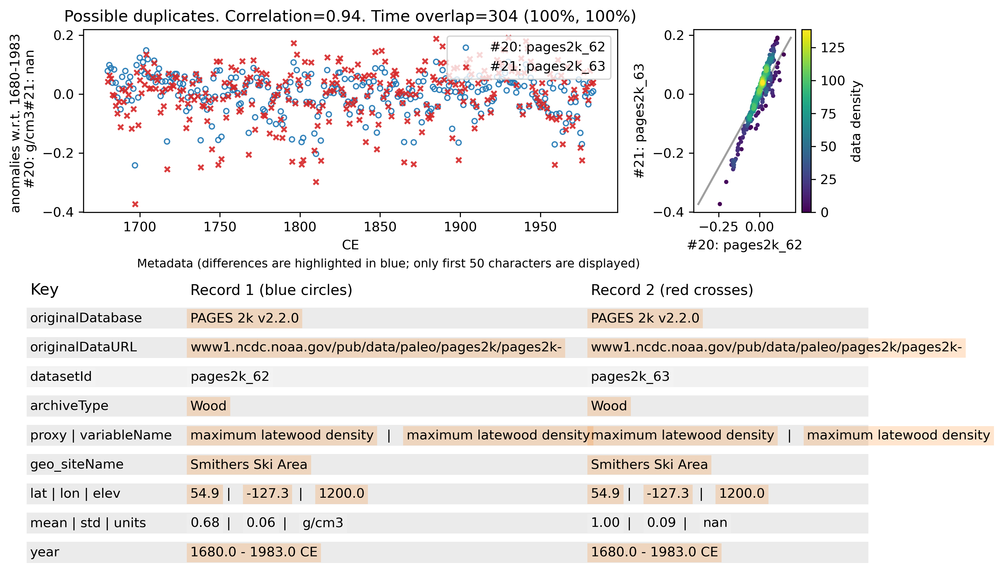

**Decision required for this duplicate pair (see figure above).**
Before inputting your decision. Would you like to leave a comment on your decision process?


6/429: **COMMENT** Please type your comment here and/or press enter. choose PAGES2K record with units rather than standardized record
6/429: **DECISION** Keep record 1 (pages2k_62, blue circles) [1], record 2 (pages2k_63, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/005_pages2k_62_pages2k_63__20_21.jpg
KEEP BLUE CIRCLES: keep pages2k_62, remove pages2k_63.
write decision to backup file
> 7/429,pages2k_81,ch2k_HE08LRA01_76,0.0,0.9999999922133574
=== POTENTIAL DUPLICATE 6/429: pages2k_81+ch2k_HE08LRA01_76 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-LosRoques.Hetzinger.2008.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/12891   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_81, keep ch2k_HE08LRA01_76.
write decision to backup file
> 8/429,pages

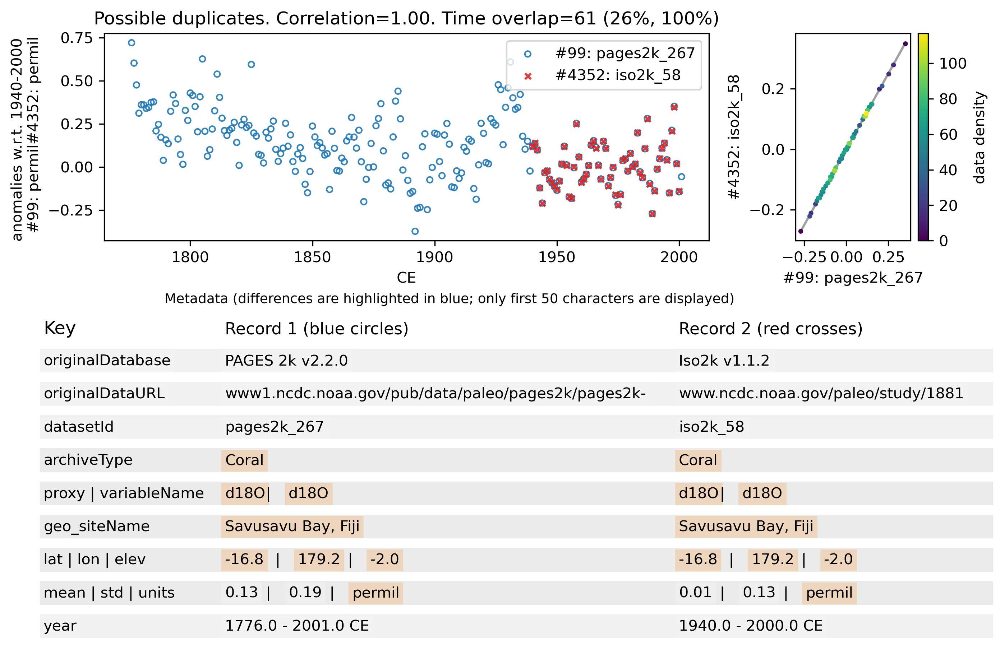

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : iso2k_1068
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1916


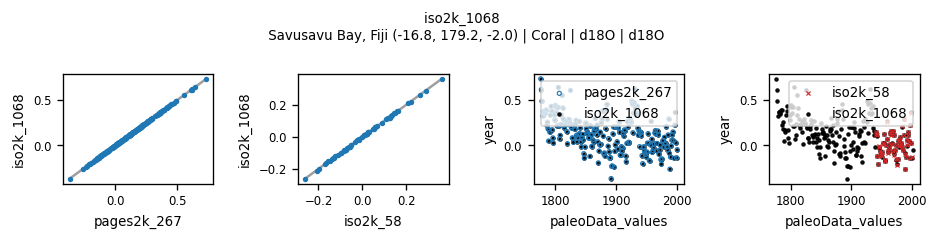

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


24/429: **COMMENT** Please type your comment here and/or press enter. choose pages2k site composite rather than individual records
24/429: **DECISION** Keep record 1 (pages2k_267, blue circles) [1], record 2 (iso2k_58, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/023_pages2k_267_iso2k_58__99_4352.jpg
KEEP BLUE CIRCLES: keep pages2k_267, remove iso2k_58.
write decision to backup file
> 25/429,pages2k_267,iso2k_1068,0.5087587517215614,0.9999999999999999
=== POTENTIAL DUPLICATE 24/429: pages2k_267+iso2k_1068 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-SavusavuBayFiji.Bagnato.2005.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1916   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_267, keep iso2k_1068.
write decision to backup file
> 26/429,pages2k_2

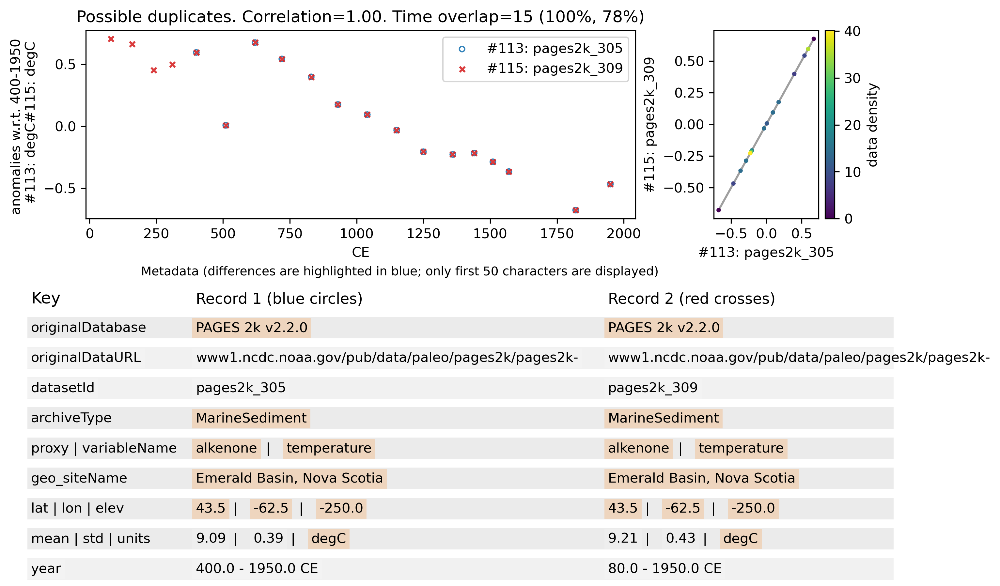

**Decision required for this duplicate pair (see figure above).**
Before inputting your decision. Would you like to leave a comment on your decision process?


31/429: **COMMENT** Please type your comment here and/or press enter. record pages2k_309 seems to be a longer time interval update from pages2k_305, but unclear from OriginalDataURL, keep longer record.
31/429: **DECISION** Keep record 1 (pages2k_305, blue circles) [1], record 2 (pages2k_309, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/030_pages2k_305_pages2k_309__113_115.jpg
KEEP RED CROSSES: remove pages2k_305, keep pages2k_309.
write decision to backup file
> 32/429,pages2k_307,pages2k_311,0.0,1.0
=== POTENTIAL DUPLICATE 31/429: pages2k_307+pages2k_311 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-EmeraldBasin.Keigwin.2007-1.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-EmeraldBasin.Keigwin.2007-2.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  False


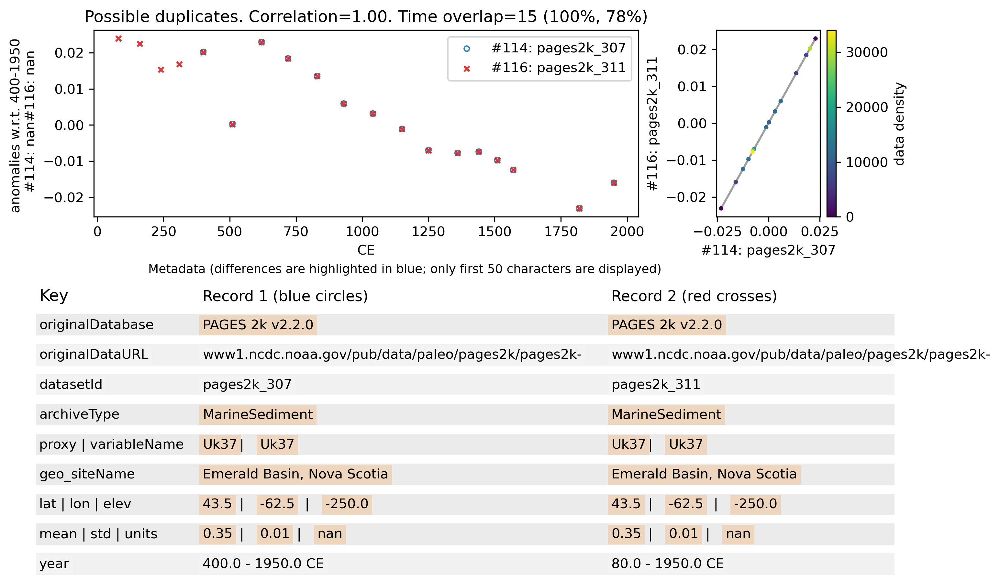

**Decision required for this duplicate pair (see figure above).**
Before inputting your decision. Would you like to leave a comment on your decision process?


32/429: **COMMENT** Please type your comment here and/or press enter. record pages2k_311 seems to be a longer time interval update from pages2k_307, but unclear from OriginalDataURL, keep longer record.
32/429: **DECISION** Keep record 1 (pages2k_307, blue circles) [1], record 2 (pages2k_311, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/031_pages2k_307_pages2k_311__114_116.jpg
KEEP RED CROSSES: remove pages2k_307, keep pages2k_311.
write decision to backup file
> 33/429,pages2k_315,iso2k_362,0.392681883222941,1.0
=== POTENTIAL DUPLICATE 32/429: pages2k_315+iso2k_362 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Arc-Austfonna.Isaksson.2005.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo-search/study/11173   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_315, keep iso2k_362.
write decision to backup file
> 34/429,pages2k_317,ch2k_NA0

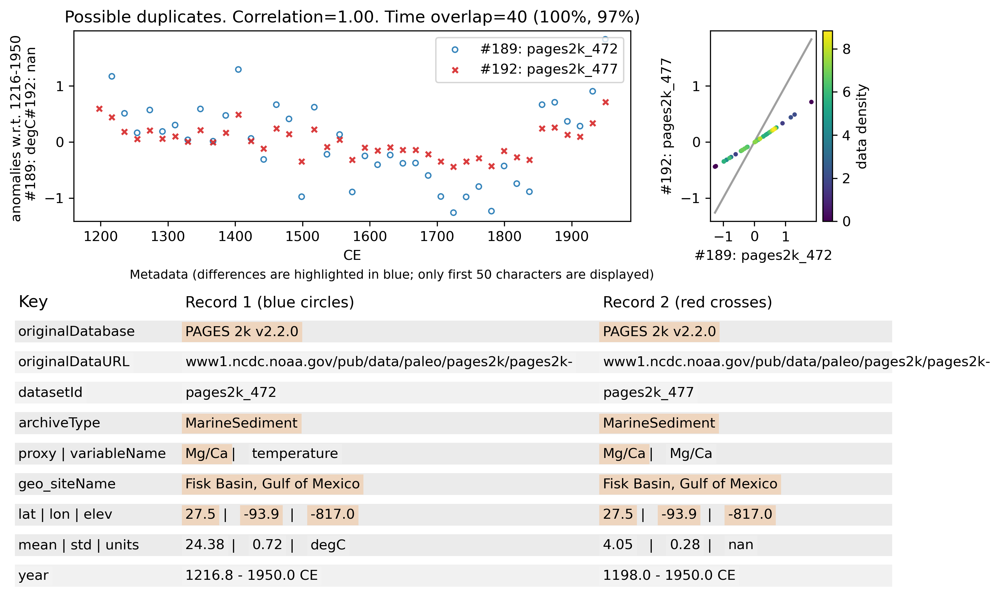

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : pages2k_474
     - URL                 : https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-FiskBasin.Richey.2009-1.txt


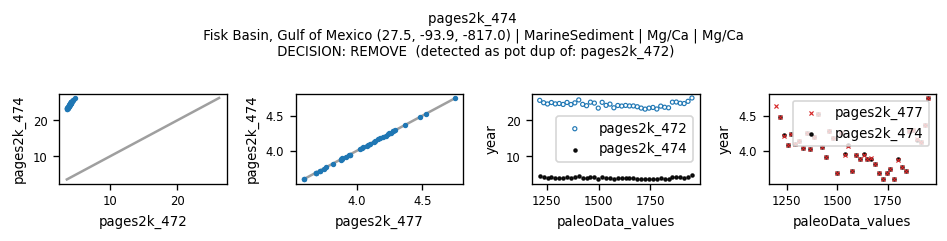

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


57/429: **COMMENT** Please type your comment here and/or press enter. keep record 1 as the reconstructed SST from two Mg/Ca records which were used to reconstruct T using equation specified in the readme for this dataset.
57/429: **DECISION** Keep record 1 (pages2k_472, blue circles) [1], record 2 (pages2k_477, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/056_pages2k_472_pages2k_477__189_192.jpg
KEEP BLUE CIRCLES: keep pages2k_472, remove pages2k_477.
write decision to backup file
> 58/429,pages2k_474,pages2k_477,0.0,0.9999463761497801
=== POTENTIAL DUPLICATE 57/429: pages2k_474+pages2k_477 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-FiskBasin.Richey.2009-1.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-FiskBasin.Richey.2009-2.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  False


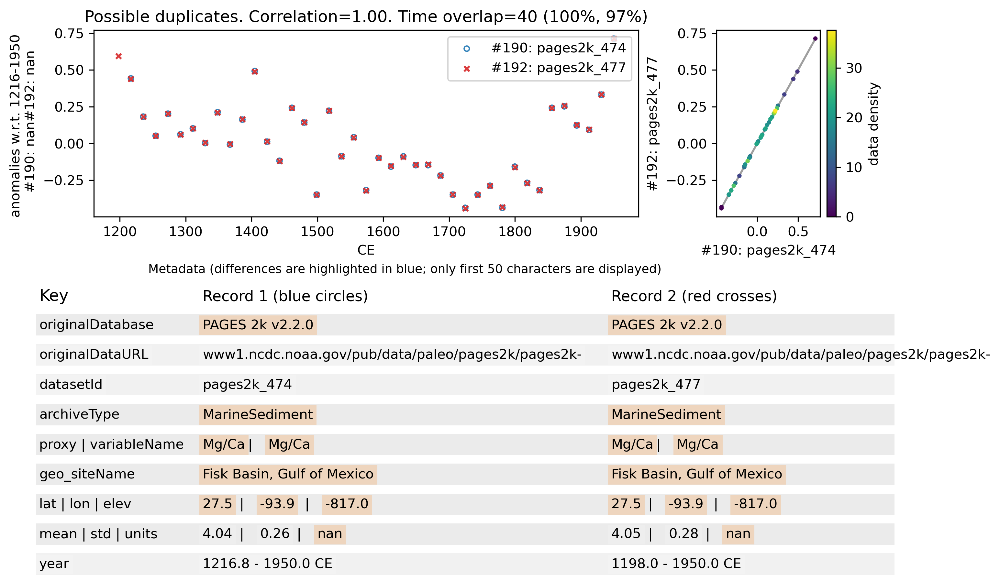

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_472
---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


58/429: **COMMENT** Please type your comment here and/or press enter. keeping neither of these Mg/Ca records, as they are used to make the Richey (2009) T reconstruction retained
58/429: **DECISION** Keep record 1 (pages2k_474, blue circles) [1], record 2 (pages2k_477, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: n


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/057_pages2k_474_pages2k_477__190_192.jpg
REMOVE BOTH: remove pages2k_477, remove pages2k_474.
write decision to backup file
> 59/429,pages2k_478,iso2k_1846,0.0,1.0
=== POTENTIAL DUPLICATE 58/429: pages2k_478+iso2k_1846 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Arc-Dye.Vinther.2010.txt   ===
=== URL 2: http://www.iceandclimate.nbi.ku.dk/data/Vinther_etal_2010_data_02feb2010.xls   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_478, keep iso2k_1846.
write decision to backup file
> 60/429,pages2k_486,FE

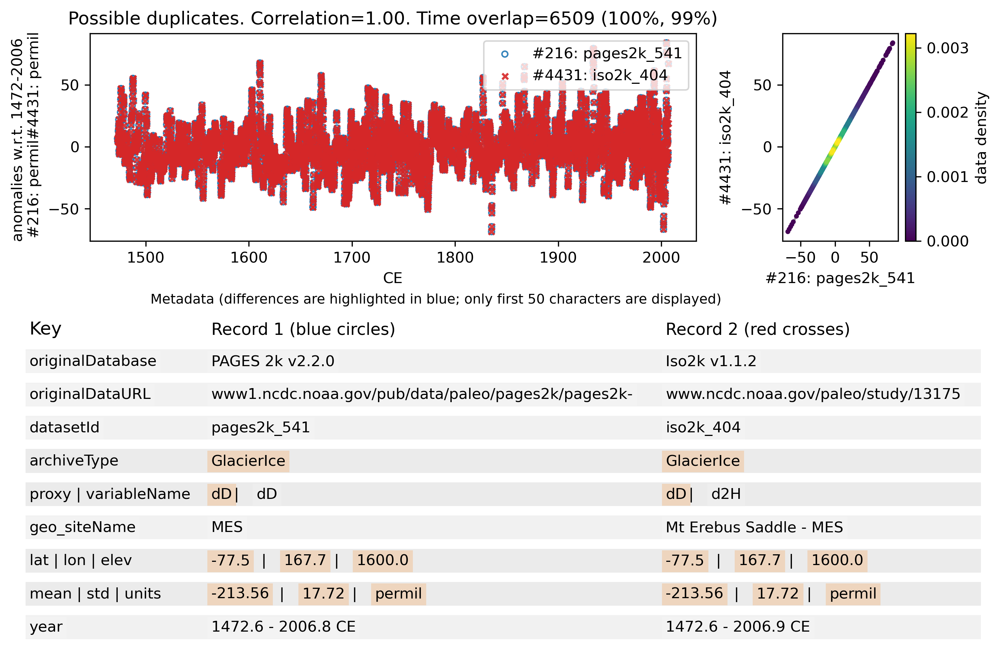

**Decision required for this duplicate pair (see figure above).**
Before inputting your decision. Would you like to leave a comment on your decision process?


65/429: **COMMENT** Please type your comment here and/or press enter. choosing the iso2k record as it is the newer database.
65/429: **DECISION** Keep record 1 (pages2k_541, blue circles) [1], record 2 (iso2k_404, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/064_pages2k_541_iso2k_404__216_4431.jpg
KEEP RED CROSSES: remove pages2k_541, keep iso2k_404.
write decision to backup file
> 66/429,pages2k_543,pages2k_976,0.0,0.9932155933107505
=== POTENTIAL DUPLICATE 65/429: pages2k_543+pages2k_976 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Asi-UKHMXD.Schweingruber.2002.txt   ===
=== URL 2: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Asi-UKHLWD.Schweingruber.2002.txt   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #1.
KEEP BLUE CIRCLES: keep

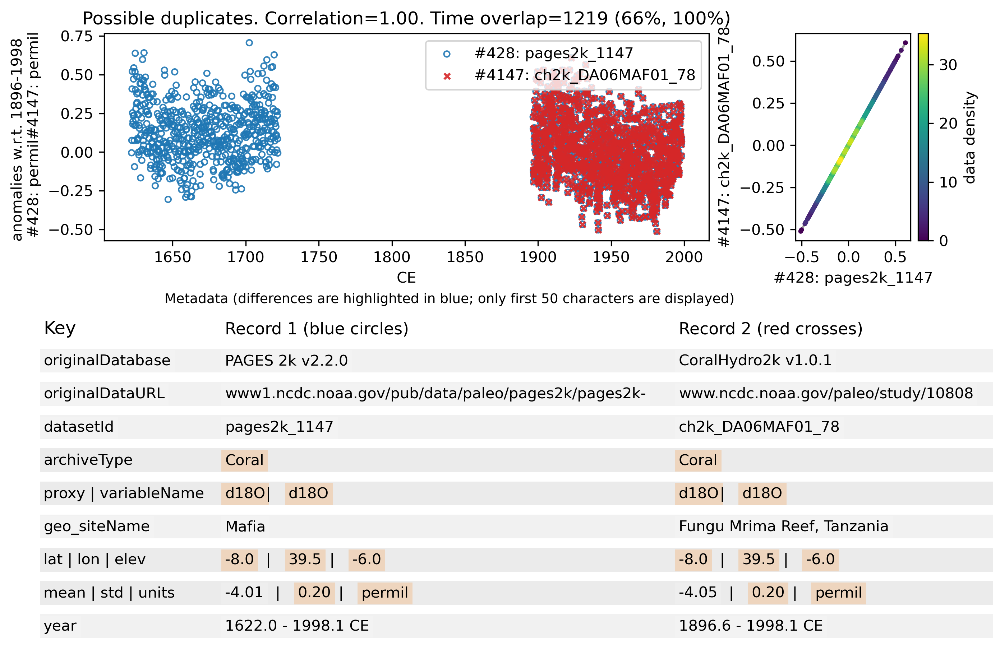

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : ch2k_DA06MAF02_104
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


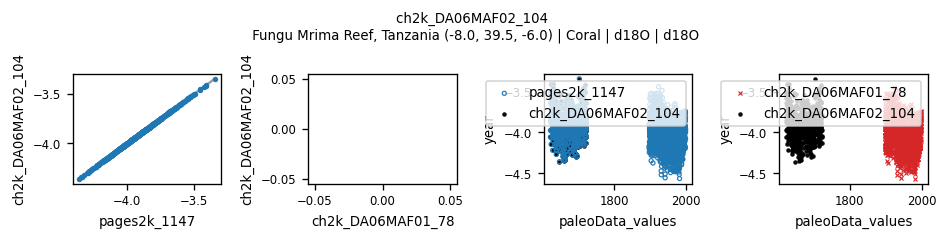

............................................................
     - Dataset ID          : iso2k_1748
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


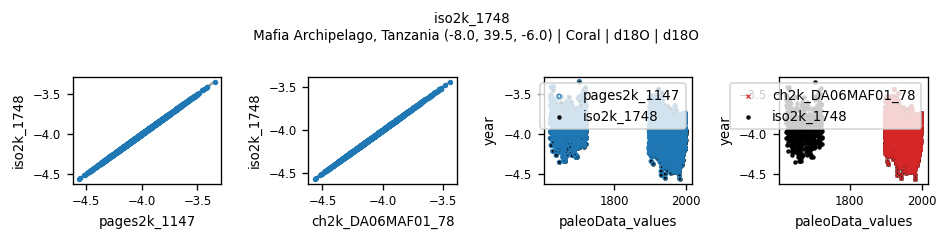

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


99/429: **COMMENT** Please type your comment here and/or press enter. choosing the PAGES2k record as it combines two time intervals in a single series record
99/429: **DECISION** Keep record 1 (pages2k_1147, blue circles) [1], record 2 (ch2k_DA06MAF01_78, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/098_pages2k_1147_ch2k_DA06MAF01_78__428_4147.jpg
KEEP BLUE CIRCLES: keep pages2k_1147, remove ch2k_DA06MAF01_78.
write decision to backup file
> 100/429,pages2k_1147,ch2k_DA06MAF02_104,0.0,1.0
=== POTENTIAL DUPLICATE 99/429: pages2k_1147+ch2k_DA06MAF02_104 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Mafia.Damassa.2006.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10808   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


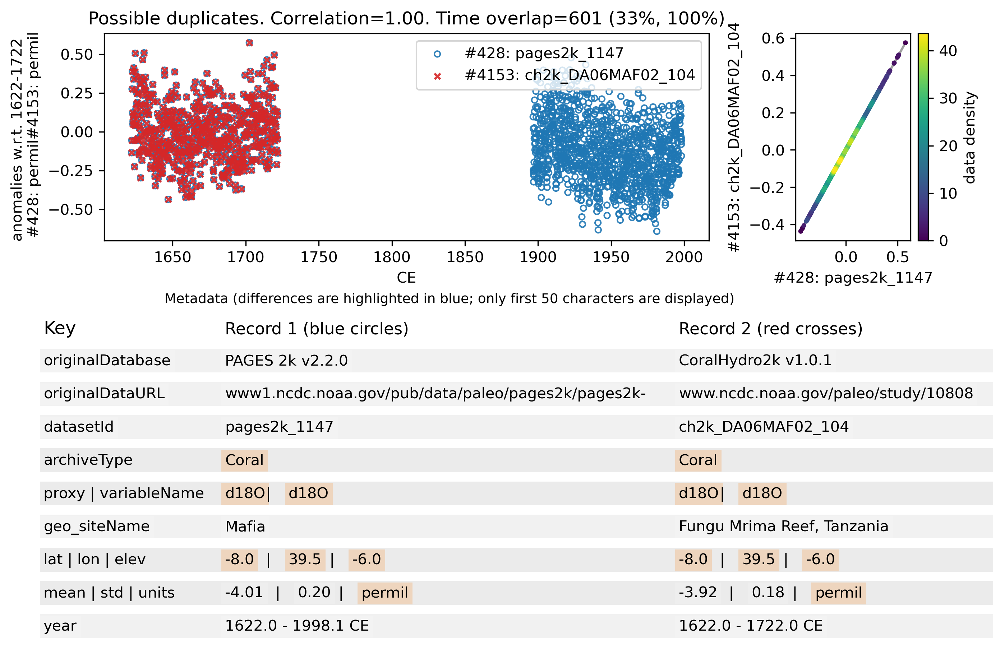

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : ch2k_DA06MAF01_78
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


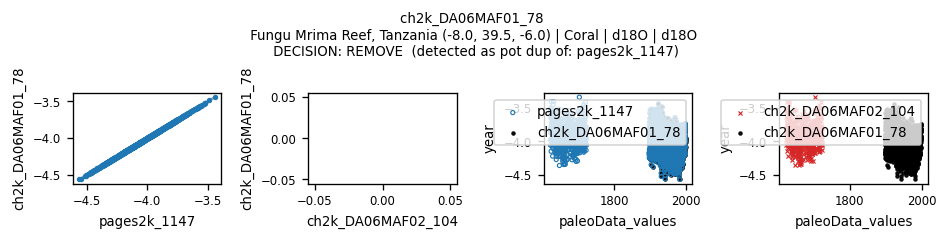

............................................................
     - Dataset ID          : iso2k_1748
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10808


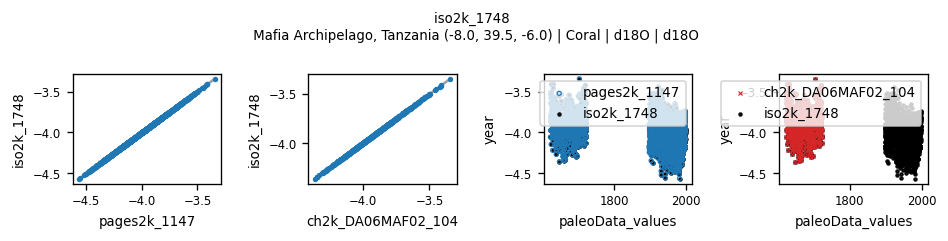

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


100/429: **COMMENT** Please type your comment here and/or press enter. choosing the PAGES2k record as it combines two time intervals in a single series record
100/429: **DECISION** Keep record 1 (pages2k_1147, blue circles) [1], record 2 (ch2k_DA06MAF02_104, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/099_pages2k_1147_ch2k_DA06MAF02_104__428_4153.jpg
KEEP BLUE CIRCLES: keep pages2k_1147, remove ch2k_DA06MAF02_104.
write decision to backup file
> 101/429,pages2k_1147,iso2k_1748,0.0,1.0
=== POTENTIAL DUPLICATE 100/429: pages2k_1147+iso2k_1748 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Mafia.Damassa.2006.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10808   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1147, keep iso2k_1748.
write decision to backup file
> 102/429,pages2k_1153,pages

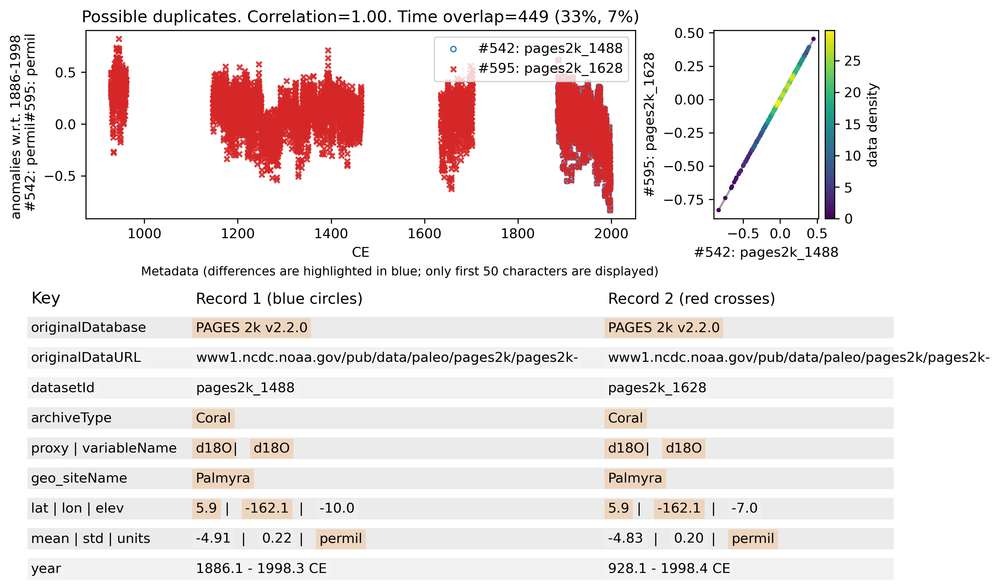

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


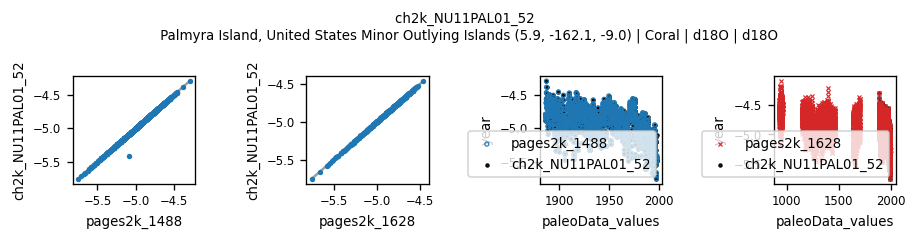

............................................................
     - Dataset ID          : iso2k_505
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1875


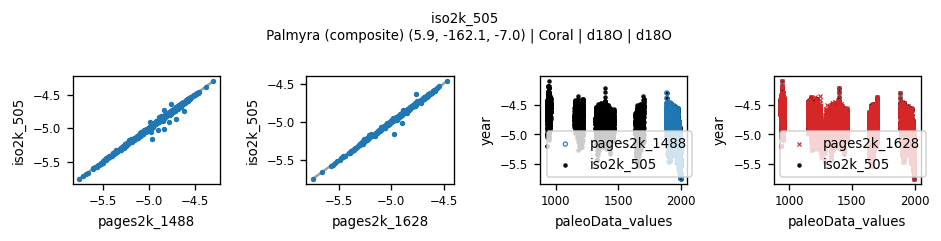

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


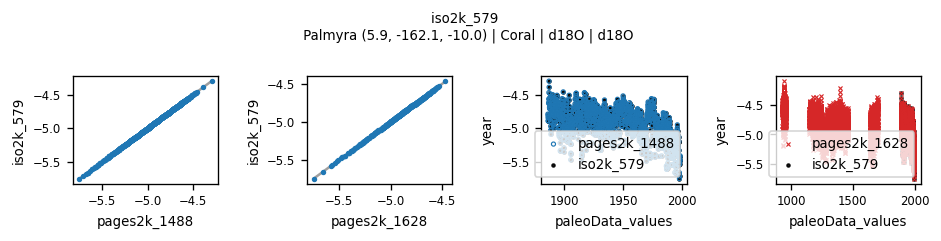

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


117/429: **COMMENT** Please type your comment here and/or press enter. choose the Palmyra compilation in pages2k v2.2.0
117/429: **DECISION** Keep record 1 (pages2k_1488, blue circles) [1], record 2 (pages2k_1628, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/116_pages2k_1488_pages2k_1628__542_595.jpg
KEEP RED CROSSES: remove pages2k_1488, keep pages2k_1628.
write decision to backup file
> 118/429,pages2k_1488,ch2k_NU11PAL01_52,0.4697858835846662,0.9992710430546085
=== POTENTIAL DUPLICATE 117/429: pages2k_1488+ch2k_NU11PAL01_52 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Nurhati.2011-1.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  True
RECORDS IDENTICAL (perfect correlation) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1488, keep ch2k_NU11PAL01_52.
write decis

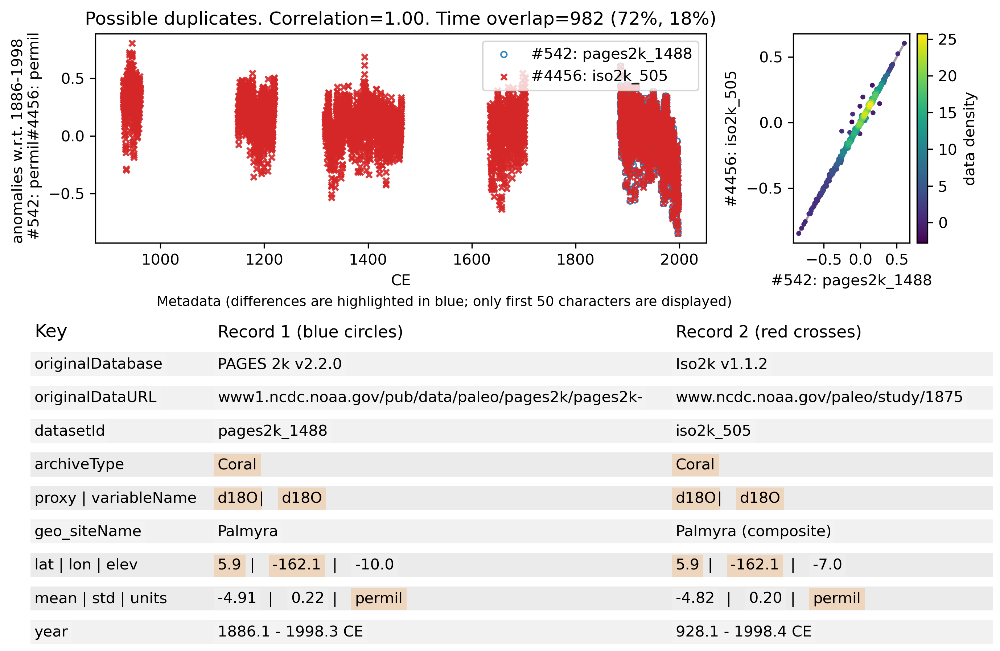

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
............................................................
     - Dataset ID          : pages2k_1628
     - URL                 : https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt


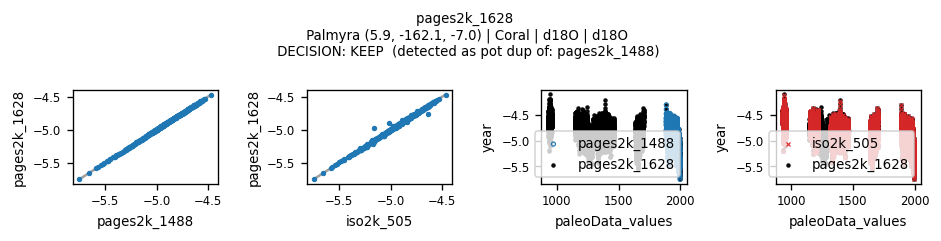

............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


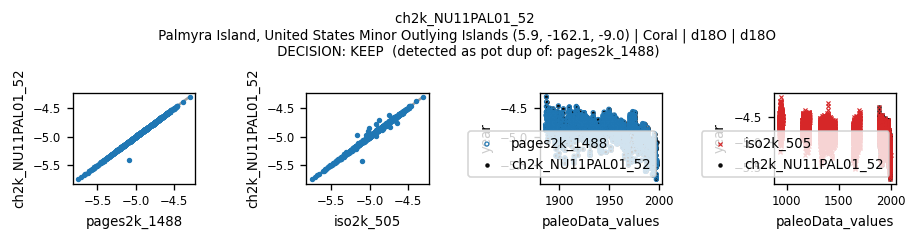

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


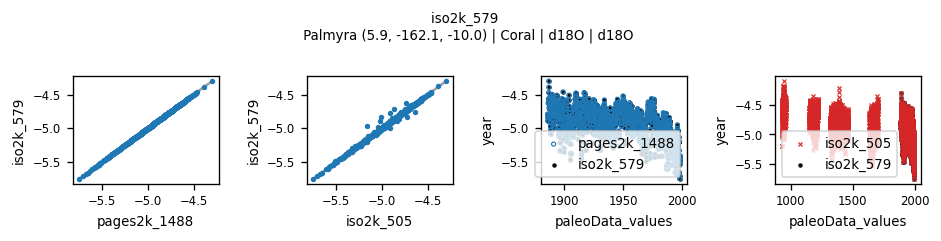

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


119/429: **COMMENT** Please type your comment here and/or press enter. choose neither in favor of the previously chosen pages2k v2.2.0 Palmyra composite
119/429: **DECISION** Keep record 1 (pages2k_1488, blue circles) [1], record 2 (iso2k_505, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: n


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/118_pages2k_1488_iso2k_505__542_4456.jpg
REMOVE BOTH: remove iso2k_505, remove pages2k_1488.
write decision to backup file
> 120/429,pages2k_1488,iso2k_579,0.0,1.0
=== POTENTIAL DUPLICATE 119/429: pages2k_1488+iso2k_579 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Nurhati.2011-1.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1488, keep iso2k_579.
write decision to backup file
> 121/429,pages2k_1490,ch2k_NU11PAL01_54,0.4697858

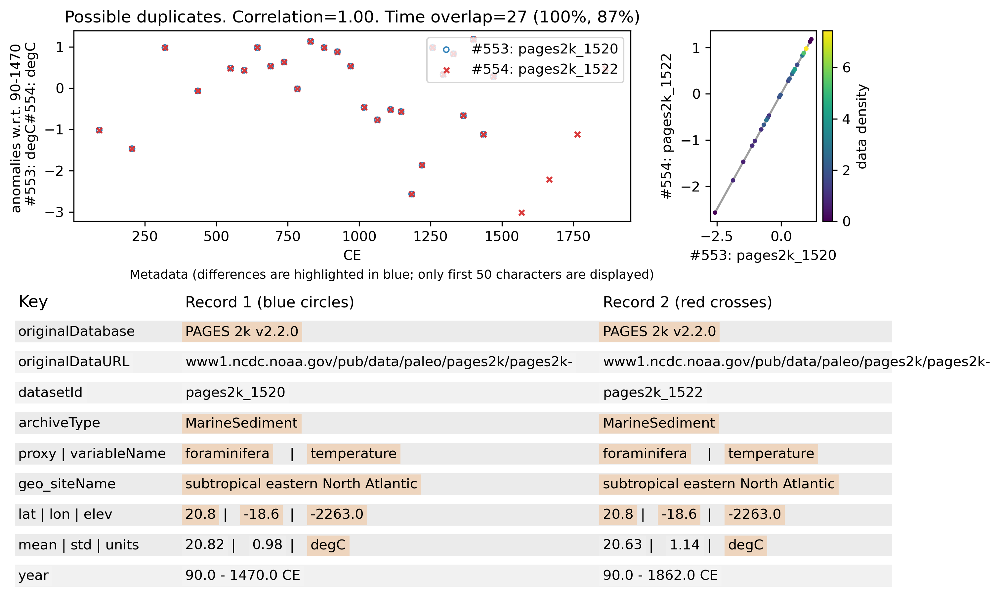

**Decision required for this duplicate pair (see figure above).**
Before inputting your decision. Would you like to leave a comment on your decision process?


125/429: **COMMENT** Please type your comment here and/or press enter. same URL, only one warm season reconstruction reported, choose the complete 2k record of the two in PAGES2k v2.2.0
125/429: **DECISION** Keep record 1 (pages2k_1520, blue circles) [1], record 2 (pages2k_1522, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/124_pages2k_1520_pages2k_1522__553_554.jpg
KEEP RED CROSSES: remove pages2k_1520, keep pages2k_1522.
write decision to backup file
> 126/429,pages2k_1547,iso2k_259,0.0,1.0
=== POTENTIAL DUPLICATE 125/429: pages2k_1547+iso2k_259 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Kiritimati.Evans.1998.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1847   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) True
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  True
correlation_perfect:  True
RECORDS IDENTICAL (identical data) except for metadata. Automatically choose #2.
KEEP RED CROSSES: remove pages2k_1547, keep iso2k_259.
write decision to backup file
> 127/429,pages2k_1566,FE23_northamerica_c

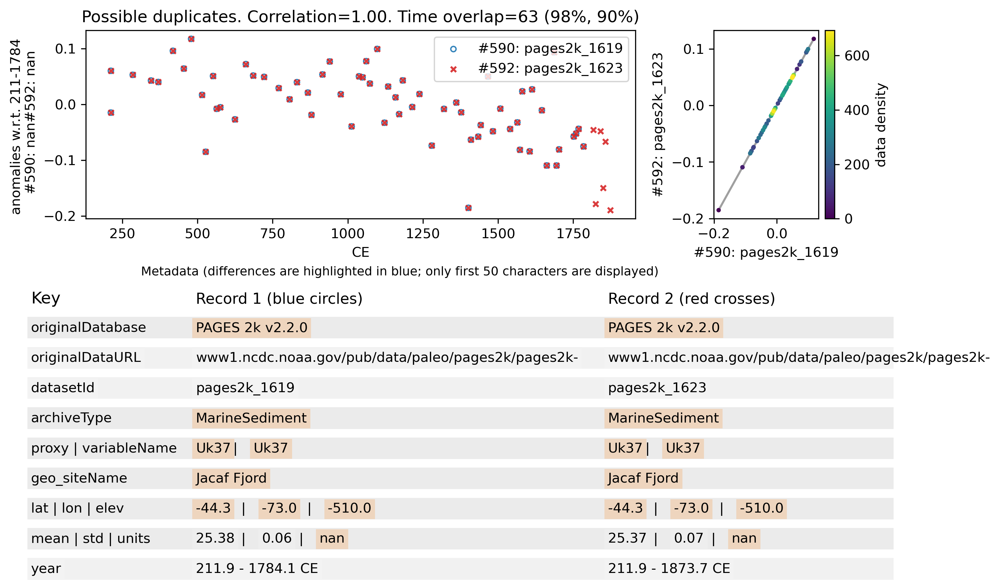

**Decision required for this duplicate pair (see figure above).**
Before inputting your decision. Would you like to leave a comment on your decision process?


129/429: **COMMENT** Please type your comment here and/or press enter. keep the version of two from PAGES2k v2.2.0 that extends to 1874
129/429: **DECISION** Keep record 1 (pages2k_1619, blue circles) [1], record 2 (pages2k_1623, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 2


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/128_pages2k_1619_pages2k_1623__590_592.jpg
KEEP RED CROSSES: remove pages2k_1619, keep pages2k_1623.
write decision to backup file
> 130/429,pages2k_1628,ch2k_NU11PAL01_52,0.4697858835846662,0.9999312398195646
=== POTENTIAL DUPLICATE 129/429: pages2k_1628+ch2k_NU11PAL01_52 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


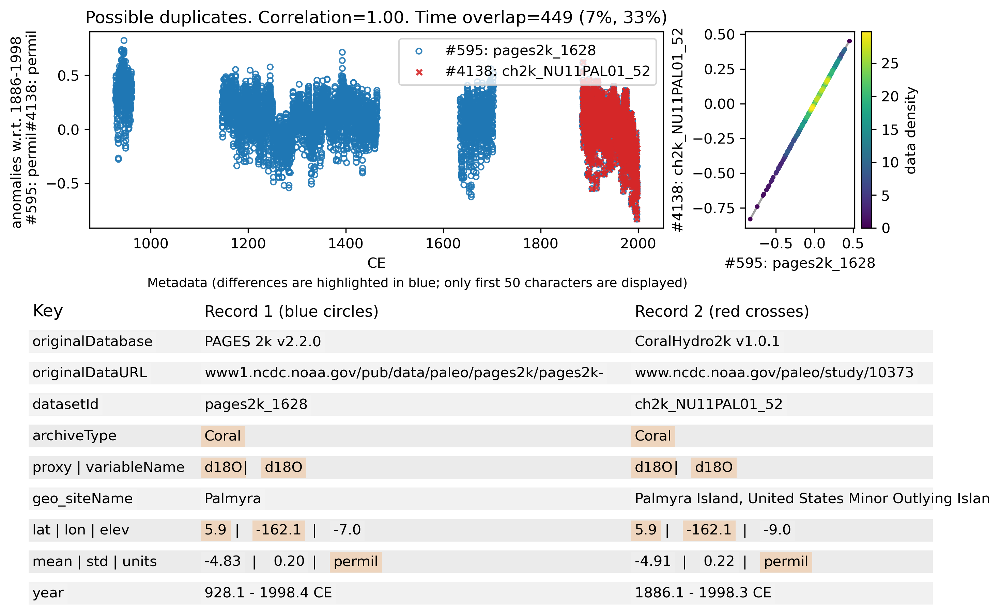

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : iso2k_505
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1875


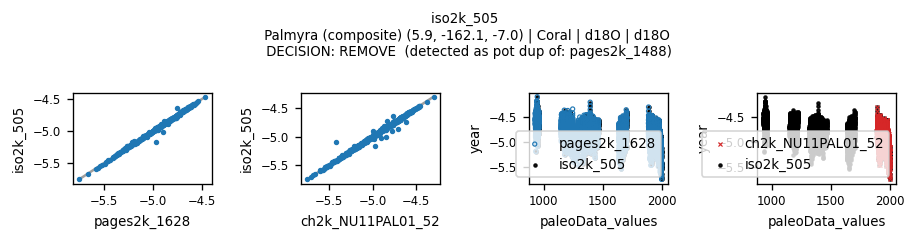

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


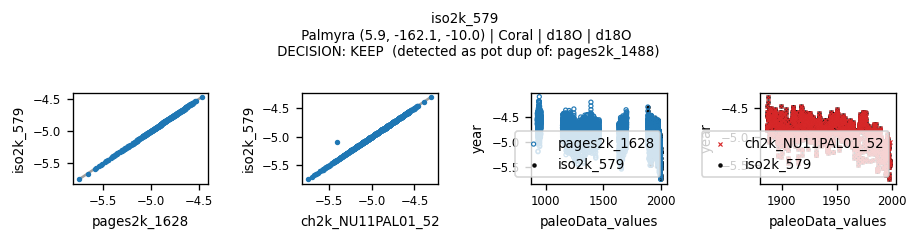

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


130/429: **COMMENT** Please type your comment here and/or press enter. keep the pages2k Palmyra composite
130/429: **DECISION** Keep record 1 (pages2k_1628, blue circles) [1], record 2 (ch2k_NU11PAL01_52, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/129_pages2k_1628_ch2k_NU11PAL01_52__595_4138.jpg
KEEP BLUE CIRCLES: keep pages2k_1628, remove ch2k_NU11PAL01_52.
write decision to backup file
> 131/429,pages2k_1628,iso2k_505,0.0,0.9973624471178902
=== POTENTIAL DUPLICATE 130/429: pages2k_1628+iso2k_505 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/1875   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False


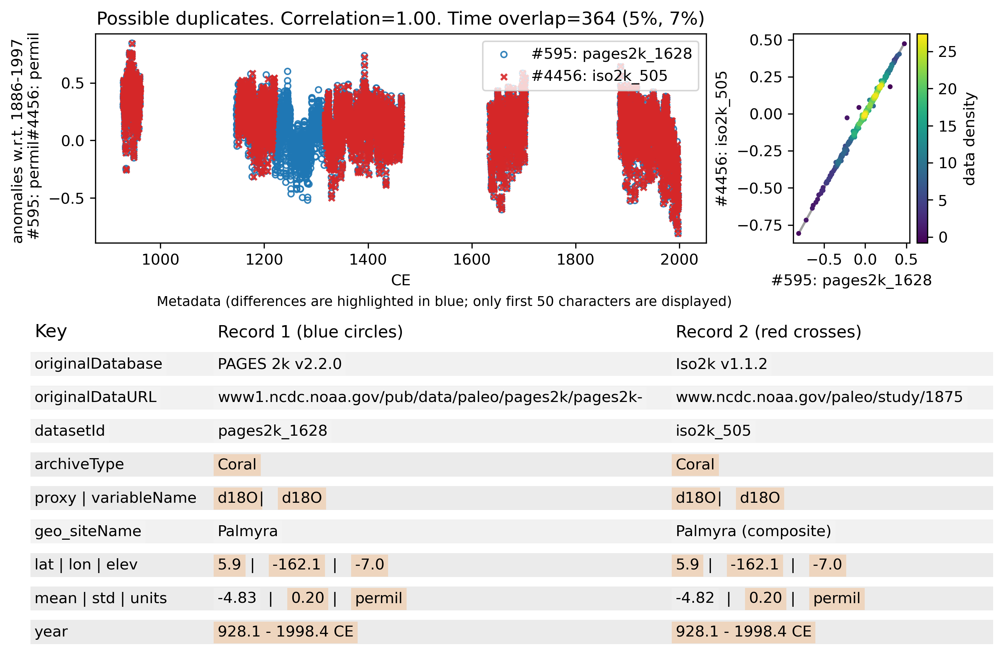

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


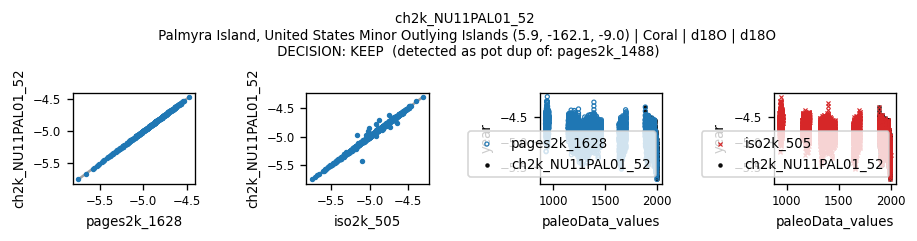

............................................................
     - Dataset ID          : iso2k_579
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


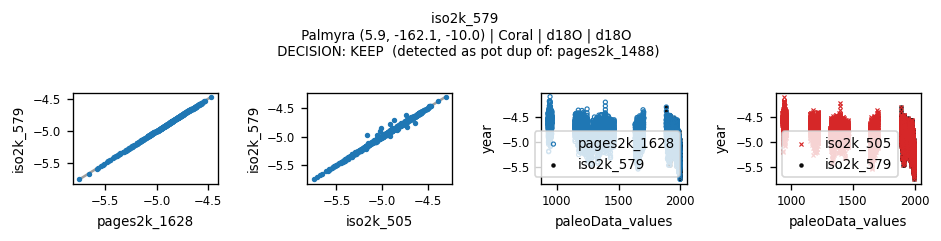

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


131/429: **COMMENT** Please type your comment here and/or press enter. keep the pages2k v2.2.0 updated Palmyra composite
131/429: **DECISION** Keep record 1 (pages2k_1628, blue circles) [1], record 2 (iso2k_505, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/130_pages2k_1628_iso2k_505__595_4456.jpg
KEEP BLUE CIRCLES: keep pages2k_1628, remove iso2k_505.
write decision to backup file
> 132/429,pages2k_1628,iso2k_579,0.0,0.9999312398195646
=== POTENTIAL DUPLICATE 131/429: pages2k_1628+iso2k_579 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/Ocn-Palmyra.Cobb.2003.txt   ===
=== URL 2: https://www.ncdc.noaa.gov/paleo/study/10373   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  False
lat True lon True elevation False archivetype True paleodata_proxy True
sites_identical:  True
URL_identical:  False
data_identical:  False
correlation_perfect:  False


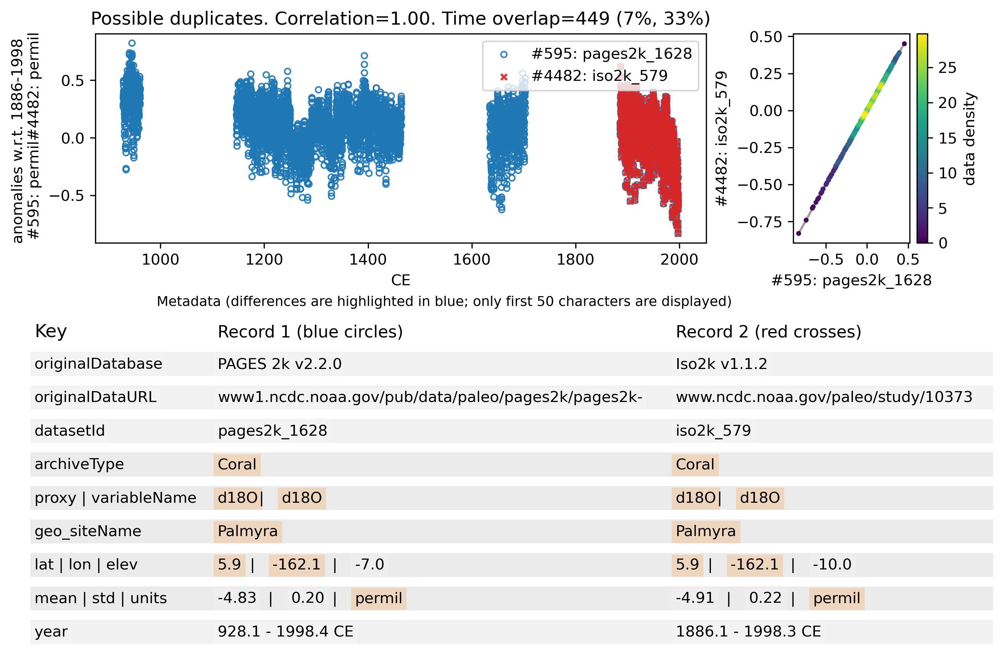

**Decision required for this duplicate pair (see figure above).**
---------------------------------------------------------------------------------------------------------
***ATTENTION*** THIS RECORD IS ASSOCIATED WITH MULTIPLE DUPLICATES! PLEASE PAY SPECIAL ATTENTION WHEN MAKING DECISIONS FOR THIS RECORD!
The potential duplicates also associated with this record are:
-  pages2k_1488
............................................................
     - Dataset ID          : ch2k_NU11PAL01_52
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/10373


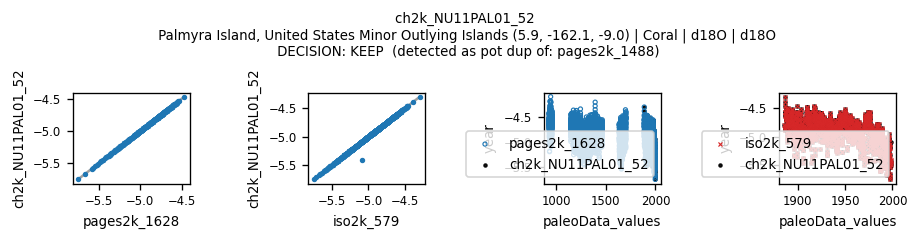

............................................................
     - Dataset ID          : iso2k_505
     - URL                 : https://www.ncdc.noaa.gov/paleo/study/1875


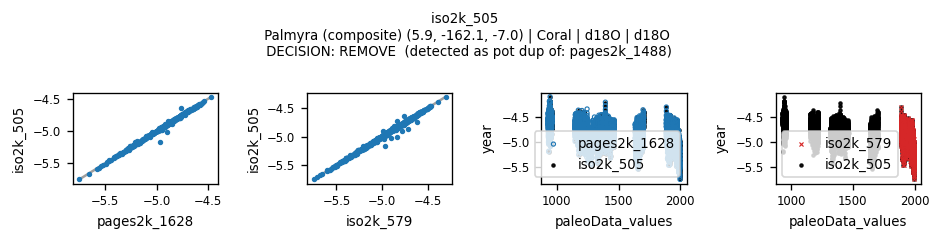

---------------------------------------------------------------------------------------------------------
Before inputting your decision. Would you like to leave a comment on your decision process?


132/429: **COMMENT** Please type your comment here and/or press enter. keep the pages2k v2.2.0 updated Palmyra composite
132/429: **DECISION** Keep record 1 (pages2k_1628, blue circles) [1], record 2 (iso2k_579, red crosses) [2], keep both [b], keep none [n] or create a composite of both records [c]? Note: only overlapping timesteps are being composited. [Type 1/2/b/n/c]: 1


saved figure in /home/jupyter-lluecke/dod2k/figs//dup_detection/all_merged/131_pages2k_1628_iso2k_579__595_4482.jpg
KEEP BLUE CIRCLES: keep pages2k_1628, remove iso2k_579.
write decision to backup file
> 133/429,pages2k_1636,FE23_northamerica_usa_wa081,6.762315219649745,0.9980630247518526
=== POTENTIAL DUPLICATE 132/429: pages2k_1636+FE23_northamerica_usa_wa081 ===
=== URL 1: https://www1.ncdc.noaa.gov/pub/data/paleo/pages2k/pages2k-temperature-v2-2017/data-version-2.0.0/NAm-MtStHelens.Briffa.1996-1.txt   ===
=== URL 2: https://www.ncei.noaa.gov/pub/data/paleo/treering/measurements/northamerica/usa/wa081-noaa.rwl   ===
True if pot_dup_corrs[i_pot_dups]>=0.98 else False True
(len(time_1)==len(time_2)) False
metadata_identical:  True
lat True lon True elevation True archivetype True paleodata_proxy True
sites_identical:  False
URL_identical:  False
data_identical:  False
correlation_perfect:  False
Automated choice. Metadata identical, automatically choose FE23 (Breitenmoser et al. (2014

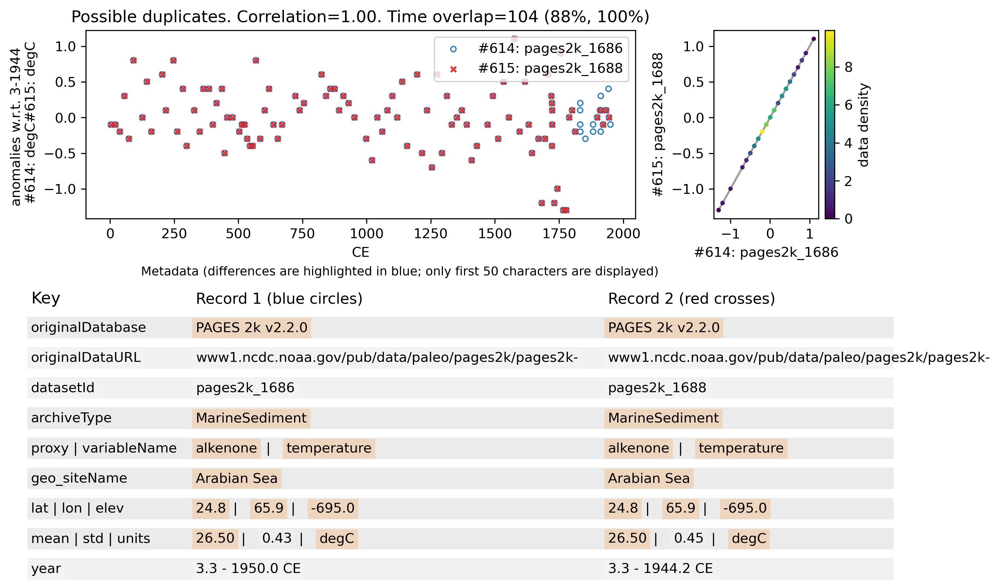

**Decision required for this duplicate pair (see figure above).**
Before inputting your decision. Would you like to leave a comment on your decision process?


In [ ]:
# remove_identicals = True if you want to automatically remove identical duplicates, without operator input
dup.duplicate_decisions_multiple(df, operator_details=operator_details, choose_recollection=True, 
                                 remove_identicals=True, backup=True, comment=True, automate_db_choice=automate_db_choice)

In [ ]:
date = str(datetime.datetime.utcnow())[2:10]
fn   = utf.find(f'dup_decisions_{df.name}_{initials}_{date}.csv', f'data/{df.name}/dup_detection')

if fn != []:
    print('----------------------------------------------------')
    print('Successfully finished the duplicate decision process!'.upper())
    print('----------------------------------------------------')
    print('Saved the decision output file in:')
    print()
    for ff in fn:
        print('%s.'%ff)
    print()
    print('You are now able to proceed with the next notebook: dup_removal.ipynb')
else:
    print('!!!!!!!!!!!!WARNING!!!!!!!!!!!')
    print('Final output file is missing.')
    print()
    print('Please re-run the notebook to complete duplicate decision process.')